This notebook aims to compare the TROPOMI NO2 column density and summertime monthly NOx emissions of soil, anthropogenic, shipping, wildfire, and lightning sources.

- TROPOMI mean NO2 data

    - s5p_no2_PAL_v231_gridding_2x2_JJA_19_20_21.nc
    - s5p_no2_PAL_v231_gridding_4x4_snowcorr1_JJA_19_20_21.nc
    - s5p_no2_PAL_v231_gridding_4x4_snowcorr2_JJA_19_20_21.nc
    - s5p_no2_PAL_v231_gridding_4x4_snowcorr3_JJA_19_20_21.nc
    - regrid_no2_stats_qa75_sha50.nc (generated by [s5p_regrid_combine.py](https://github.com/zxdawn/S5P-LNO2/blob/main/main/s5p_regrid_combine.py))

    Default PAL v2.3.1 run:
    qa_value > 0.75 corresponds to scene_pressure > 0.98 * surface_pressure

    "snowcorrection"
        scene_pressure > 0.96 * surface_pressure

    "snowcorr2"
        scene_pressure > 0.94 * surface_pressure

    "snowcorr3"
        scene_pressure > 0.90 * surface_pressure

- soil, ship, and anthro: [CAMS](https://ads.atmosphere.copernicus.eu/cdsapp#!/dataset/cams-global-emission-inventories?tab=form)

    - CAMS-GLOB-ANT_v4.2_nitrogen-oxides_2018.nc
    - CAMS-GLOB-SOIL_v2.2_nitrogen-oxides_2018.nc
    - CAMS-GLOB-SHIP_v2.1_nitrogen-oxides_2018.nc


- wildfire: [CAMS global biomass burning emissions based on fire radiative power (GFAS)](https://ads.atmosphere.copernicus.eu/cdsapp#!/dataset/cams-global-fire-emissions-gfas)

    - gfas_2019.nc, gfas_2020.nc, gfas_2021.nc

- lightning: gridded lightning NO2 product

    - S5P_LNO2_grid.nc generated by [`s5p_lno2_grid.py`](https://github.com/zxdawn/S5P-LNO2/blob/main/main/s5p_lno2_grid.py)

The area files are generated by `cdo gridarea <input.nc> <output.nc>`

- CAMS-GLOB-ANT_v4.2_nitrogen-oxides_2018_area.nc
- CAMS-GLOB-SOIL_v2.2_nitrogen-oxides_2018_area.nc
- gfas_2018_area.nc
- LNO2_emiss_area.nc

In [1]:
import pandas as pd
import numpy as np
import xarray as xr
import cartopy.crs as ccrs
import proplot as pplt
from scipy import stats
from glob import glob

from shapely.prepared import prep
import cartopy.io.shapereader as shpreader
from shapely.ops import unary_union
import shapely.vectorized
from matplotlib.colors import LogNorm

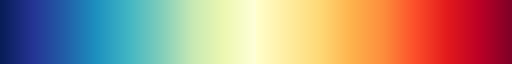

In [2]:
# create colormap
cmap = pplt.Colormap('YlGnBu_r', 'YlOrRd', ratios=(1, 1), name='tropomi_no2')
cmap

## Read VIIRS widlfire data

In [3]:
df_viirs = pd.concat(pd.read_csv(f, dtype={'acq_time': 'str'}) for f in glob('../data/viirs/*csv'))

In [4]:
# regrid to 0.1*0.1 deg grid
lon_resolution = 0.1
lat_resolution = 0.1
lon_bnd = np.arange(-180, 180+lon_resolution, lon_resolution)
lat_bnd = np.arange(60, 90+lat_resolution, lat_resolution)
lon_center = np.convolve(lon_bnd, np.ones(2), 'valid') / 2
lat_center = np.convolve(lat_bnd, np.ones(2), 'valid') / 2

fire_count = stats.binned_statistic_2d(df_viirs['latitude'], df_viirs['longitude'], None,
                                            'count', bins=[lat_bnd,lon_bnd]).statistic

fire_count = xr.DataArray(fire_count, dims=['latitude', 'longitude'], coords=[lat_center, lon_center]).rename('fire_count')

In [5]:
fire_count_stacked = fire_count.where(fire_count>300).stack(x=['longitude','latitude'])
lon_fire = fire_count_stacked[fire_count_stacked.notnull()]['longitude']
lat_fire = fire_count_stacked[fire_count_stacked.notnull()]['latitude']

## TROPOMI VCDs

### Regrid mean NO2 VCD

#### Comparisons of different snow-cloud filters

In [6]:
# scene_pressure > 0.96 * surface_pressure
vcd_regrid_xin = xr.open_dataset('../data/tropomi_regrid_combine/regrid_no2_stats_qa75_sha50.nc')['vcd_mean']
vcd_regrid_xin = vcd_regrid_xin.where(vcd_regrid_xin.coords['latitude']>=60, drop=True)

# scene_pressure > 0.96 * surface_pressure
vcd_regrid_98 = xr.open_dataset('../data/tropomi_regrid_combine/s5p_no2_PAL_v231_gridding_2x2_JJA_19_20_21.nc')['no2_vcd_trop_gridded']
vcd_regrid_98 = vcd_regrid_98.where(vcd_regrid_98.coords['lat']>=60, drop=True)

# scene_pressure > 0.96 * surface_pressure
vcd_regrid_96 = xr.open_dataset('../data/tropomi_regrid_combine/s5p_no2_PAL_v231_gridding_4x4_snowcorr1_JJA_19_20_21.nc')['no2_vcd_trop_gridded']
vcd_regrid_96 = vcd_regrid_96.where(vcd_regrid_96.coords['lat']>=60, drop=True)

# scene_pressure > 0.94 * surface_pressure
vcd_regrid_94 = xr.open_dataset('../data/tropomi_regrid_combine/s5p_no2_PAL_v231_gridding_4x4_snowcorr2_JJA_19_20_21.nc')['no2_vcd_trop_gridded']
vcd_regrid_94 = vcd_regrid_94.where(vcd_regrid_94.coords['lat']>=60, drop=True)

# scene_pressure > 0.90 * surface_pressure
vcd_regrid_90 = xr.open_dataset('../data/tropomi_regrid_combine/s5p_no2_PAL_v231_gridding_4x4_snowcorr2_JJA_19_20_21.nc')['no2_vcd_trop_gridded']
vcd_regrid_90 = vcd_regrid_90.where(vcd_regrid_90.coords['lat']>=60, drop=True)

In [7]:
vcd_regrid_96

<xarray.DataArray 'no2_vcd_trop_gridded' (lat: 720, lon: 8640)>
array([[5.5976324, 6.038286 , 5.969272 , ..., 7.036132 , 6.9295983,
        5.963262 ],
       [5.928887 , 5.974353 , 6.424834 , ..., 6.885785 , 6.330124 ,
        5.85817  ],
       [6.0812078, 6.388563 , 6.4328794, ..., 7.9037943, 6.386326 ,
        6.6854534],
       ...,
       [      nan,       nan,       nan, ...,       nan,       nan,
              nan],
       [      nan,       nan,       nan, ...,       nan,       nan,
              nan],
       [      nan,       nan,       nan, ...,       nan,       nan,
              nan]], dtype=float32)
Coordinates:
  * lat      (lat) float32 60.02 60.06 60.1 60.15 ... 89.85 89.9 89.94 89.98
  * lon      (lon) float32 -180.0 -179.9 -179.9 -179.9 ... 179.9 179.9 180.0
Attributes:
    standard_name:  nitrogen_dioxide_vcd_trop_gridded
    long_name:      NO2 tropospheric column gridded mean, TROPOMI sensor
    units:          1e-6 mol m^-2

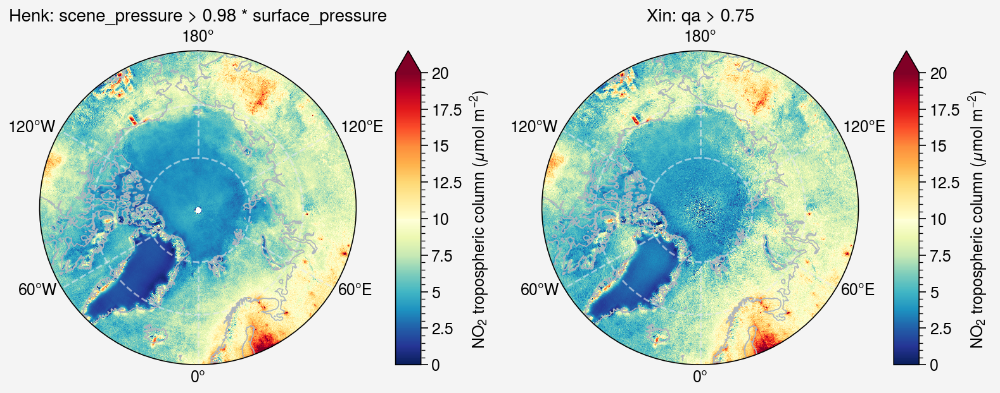

In [8]:
fig, axs = pplt.subplots(proj='npstere', ncols=2)

axs.format(boundinglat=60, latlines=10, coast=True, lonlabels='lrbt', coastcolor='gray5', reso='med', gridcolor='gray2', 
gridlinewidth=1, gridalpha=0.6, gridlinestyle='--',)

ax = axs[0]
lons, lats = np.meshgrid(vcd_regrid_98['lon'], vcd_regrid_98['lat'])
m = ax.pcolormesh(lons, lats, vcd_regrid_98, cmap=cmap, vmin=0, vmax=20, discrete=False, extend='max')
ax.format(title='Henk: scene_pressure > 0.98 * surface_pressure')
ax.colorbar([m], loc='r', label='NO$_2$ tropospheric column ($\mu$mol m$^{-2}$)')


ax = axs[1]
lons, lats = np.meshgrid(vcd_regrid_xin['longitude'], vcd_regrid_xin['latitude'])
m = ax.pcolormesh(lons, lats, vcd_regrid_xin, cmap=cmap, vmin=0, vmax=20, discrete=False, extend='max')
ax.format(title='Xin: qa > 0.75')
ax.colorbar([m], loc='r', label='NO$_2$ tropospheric column ($\mu$mol m$^{-2}$)')

fig.savefig('../figures/no2_mean_comp.jpg')

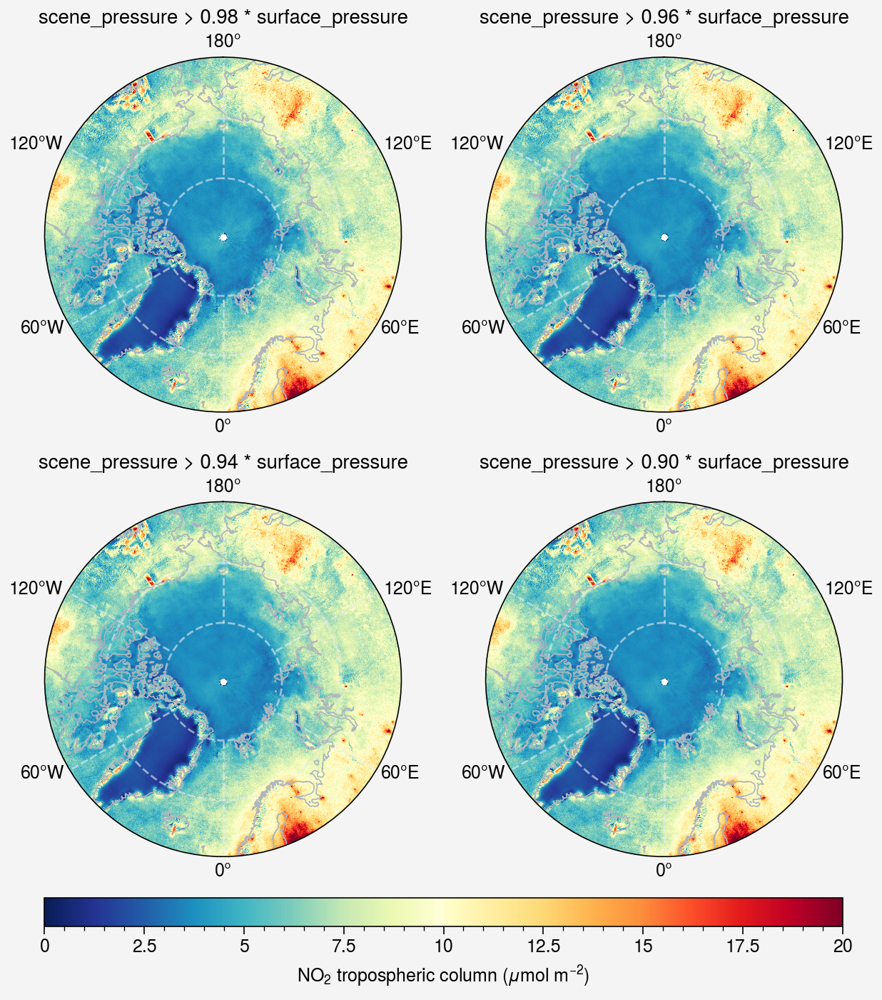

In [9]:
fig, axs = pplt.subplots(proj='npstere', nrows=2, ncols=2)

axs.format(boundinglat=60, latlines=10, coast=True, lonlabels='lrbt', coastcolor='gray5', reso='med', gridcolor='gray2', 
gridlinewidth=1, gridalpha=0.6, gridlinestyle='--',)

ax = axs[0]
lons, lats = np.meshgrid(vcd_regrid_98['lon'], vcd_regrid_98['lat'])
m = ax.pcolormesh(lons, lats, vcd_regrid_98, cmap=cmap, vmin=0, vmax=20, discrete=False)
ax.format(title='scene_pressure > 0.98 * surface_pressure')
# ax.colorbar([m], loc='l', label='NO$_2$ tropospheric column ($\mu$mol m$^{-2}$)')

ax = axs[1]
lons, lats = np.meshgrid(vcd_regrid_96['lon'], vcd_regrid_96['lat'])
vcd_regrid_98_coarsen = vcd_regrid_98.coarsen(lat=2, lon=2).mean().values
m = ax.pcolormesh(lons, lats, vcd_regrid_96, cmap=cmap, vmin=0, vmax=20, discrete=False)
ax.format(title='scene_pressure > 0.96 * surface_pressure')

ax = axs[2]
lons, lats = np.meshgrid(vcd_regrid_94['lon'], vcd_regrid_94['lat'])
m = ax.pcolormesh(lons, lats, vcd_regrid_94, cmap=cmap, vmin=0, vmax=20, discrete=False)
ax.format(title='scene_pressure > 0.94 * surface_pressure')

ax = axs[3]
lons, lats = np.meshgrid(vcd_regrid_90['lon'], vcd_regrid_90['lat'])
m = ax.pcolormesh(lons, lats, vcd_regrid_90, cmap=cmap, vmin=0, vmax=20, discrete=False)
ax.format(title='scene_pressure > 0.90 * surface_pressure')

fig.colorbar([m], loc='b', label=r'NO$_2$ tropospheric column ($\mu$mol m$^{-2}$)')

# fig.savefig('../figures/no2_mean_comp.jpg')

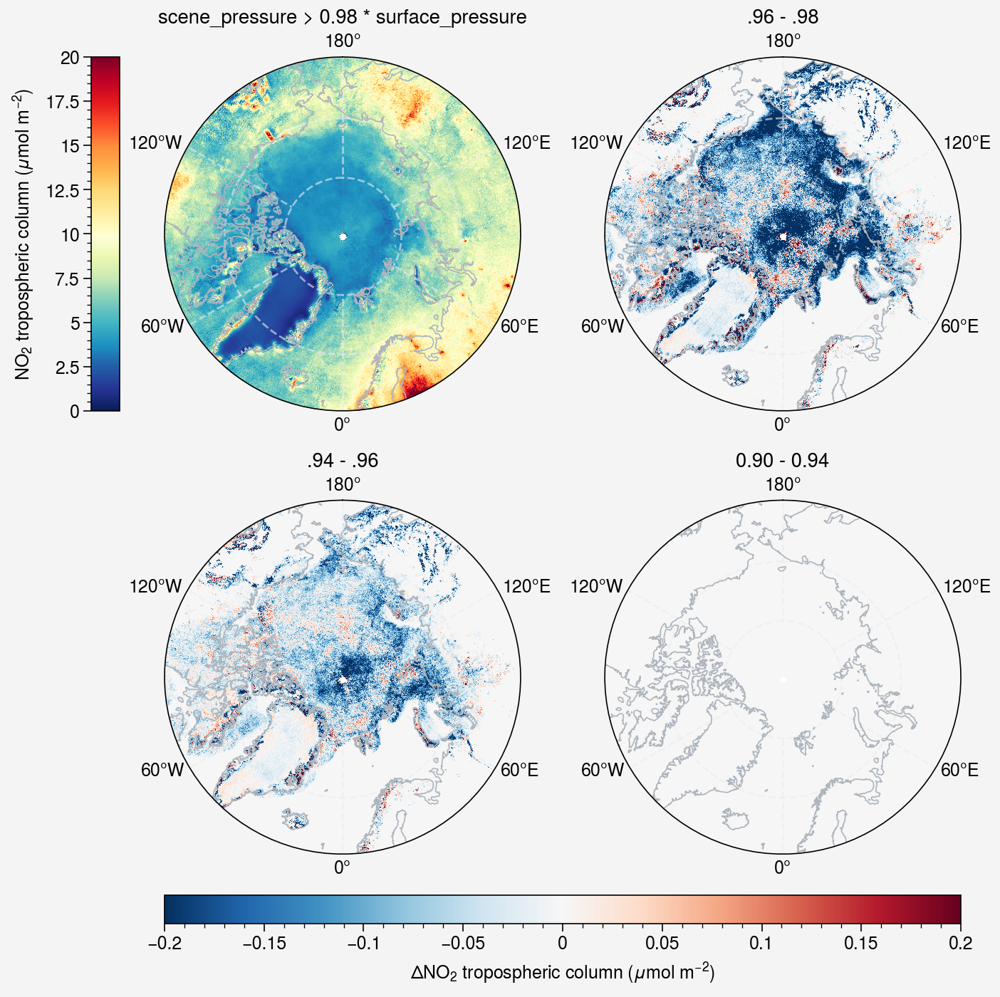

In [10]:
fig, axs = pplt.subplots(proj='npstere', nrows=2, ncols=2)

axs.format(boundinglat=60, latlines=10, coast=True, lonlabels='lrbt', coastcolor='gray5', reso='med', gridcolor='gray2', 
gridlinewidth=1, gridalpha=0.6, gridlinestyle='--',)

ax = axs[0]
lons, lats = np.meshgrid(vcd_regrid_98['lon'], vcd_regrid_98['lat'])
m = ax.pcolormesh(lons, lats, vcd_regrid_98, cmap=cmap, vmin=0, vmax=20, discrete=False)
ax.format(title='scene_pressure > 0.98 * surface_pressure')
ax.colorbar([m], loc='l', label='NO$_2$ tropospheric column ($\mu$mol m$^{-2}$)')

ax = axs[1]
lons, lats = np.meshgrid(vcd_regrid_96['lon'], vcd_regrid_96['lat'])
vcd_regrid_98_coarsen = vcd_regrid_98.coarsen(lat=2, lon=2).mean().values
m = ax.pcolormesh(lons, lats, vcd_regrid_96-vcd_regrid_98_coarsen, vmin=-0.2, vmax=0.2, discrete=False)
ax.format(title='.96 - .98')

ax = axs[2]
lons, lats = np.meshgrid(vcd_regrid_94['lon'], vcd_regrid_94['lat'])
m = ax.pcolormesh(lons, lats, vcd_regrid_94-vcd_regrid_96, vmin=-0.2, vmax=0.2, discrete=False)
ax.format(title='.94 - .96')

ax = axs[3]
lons, lats = np.meshgrid(vcd_regrid_90['lon'], vcd_regrid_90['lat'])
m = ax.pcolormesh(lons, lats, vcd_regrid_90-vcd_regrid_94, vmin=-0.2, vmax=0.2, discrete=False)
ax.format(title='0.90 - 0.94')

fig.colorbar([m], loc='b', label=r'$\Delta$NO$_2$ tropospheric column ($\mu$mol m$^{-2}$)')

# fig.savefig('../figures/no2_mean_comp_1.jpg')

Because the snow-cloud filter affects the mean VCD very little, we choose `scene_pressure > 0.96 * surface_pressure` as the final one.

In [11]:
# vcd_regrid = xr.open_dataset('../data/tropomi_regrid/s5p_no2_PAL_v231_gridding_4x4_snowcorr1_JJA_19_20_21.nc')['no2_vcd_trop_gridded']
# vcd_regrid = vcd_regrid.where(vcd_regrid.coords['lat']>=60, drop=True)#.plot(x='lon', vmin=0, vmax=30)##.coarsen(lon=5, lat=5).mean()

vcd_regrid = vcd_regrid_96

## Pick hotpots of NO2 VCD

In [12]:
def plot_mean_no2(no2, ax):
    lons, lats = np.meshgrid(no2['lon'], no2['lat'])

    m = ax.pcolormesh(lons, lats, no2, cmap=cmap, vmin=0, vmax=20, discrete=False, rasterized=True)

    ax.colorbar([m], loc='b', label='NO$_2$ tropospheric column ($\mu$mol m$^{-2}$)')
    # ax.format(title='Mean NO$_2$ tropospheric column')

In [13]:
# import hvplot.xarray

# img = vcd_regrid.hvplot.quadmesh('lon', 'lat', 
# # projection='NorthPolarStereo', 
# projection='PlateCarree',
# cmap='Thermal', rasterize=True, dynamic=False, coastline=True, clim=(0, 20)) #width=400, 

# from bokeh import models
# hover = models.HoverTool(tooltips=[
#     ("lon", "@x"),
#     ("lat", "@y"),
#      ("test", "@image"),
# ])

# # # hover = models.HoverTool(tooltips=[
# # #     ("lon", "@lon"),
# # #     ("lat", "@lat"),
# # # ])

# img.options(tools=[hover])

In [14]:
oil_gas_points = np.array([[-148.6, 70.2], [-144.4, 69.5], [-149.8, 61.2], [129.7, 62], [50.8, 61.8], [53.7, 63.5], [64.2, 67.5], [73.5, 61.2]])
mining_points = np.array([[-145.6, 63.6], [88, 69.5], [76.8, 66],[33.5, 69.2], [34, 67.6], [10.4, 63.4]])

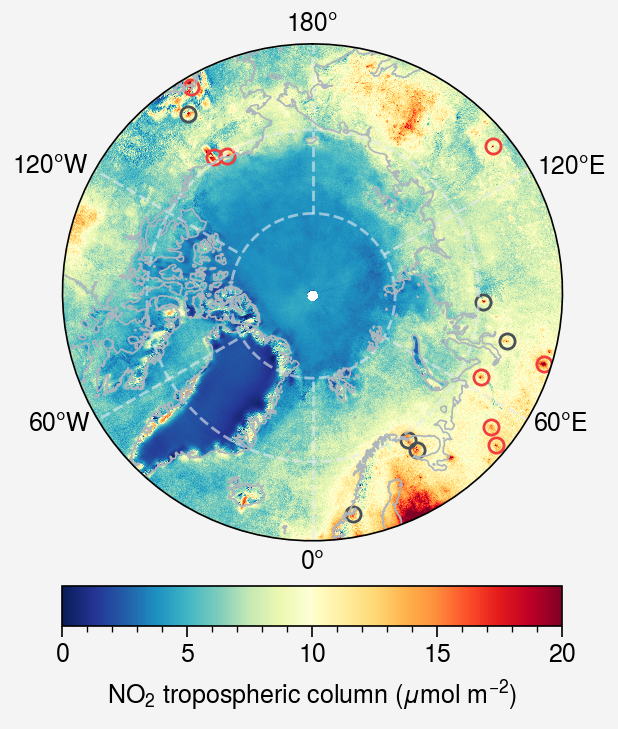

In [15]:
fig, axs = pplt.subplots(proj='npstere')

axs[0].format(boundinglat=60, latlines=10, coast=True, lonlabels='lrbt', coastcolor='gray5', reso='med', gridcolor='gray2', 
gridlinewidth=1, gridalpha=0.6, gridlinestyle='--',)

ax = axs[0]
plot_mean_no2(vcd_regrid, ax)

ax.scatter(oil_gas_points[:, 0], oil_gas_points[:, 1], facecolors='none', edgecolor='red7', edgewidth=1, s=30, label='Oil & gas')
ax.scatter(mining_points[:, 0], mining_points[:, 1], facecolors='none', edgecolor='gray7', edgewidth=1, s=30, label='Mining')

## Statistics

In [16]:
mining_summer_vcd = vcd_regrid.sel(lon=xr.DataArray(mining_points[:, 0]), lat=xr.DataArray(mining_points[:, 1]), method='nearest')
print('summer no2 at mining locations', mining_summer_vcd.mean().values, '$\pm$', mining_summer_vcd.std().values)

summer no2 at mining locations 17.338646 $\pm$ 1.9183031


In [17]:
print('no2 above 70 is ??% less than no2 between 60 and 65 N:')
(vcd_regrid.where(vcd_regrid.lat>70).mean() - vcd_regrid.where((vcd_regrid.lat>60)&(vcd_regrid.lat<65)).mean())/vcd_regrid.where((vcd_regrid.lat>60)&(vcd_regrid.lat<65)).mean()

no2 above 70 is ??% less than no2 between 60 and 65 N:


<xarray.DataArray 'no2_vcd_trop_gridded' ()>
array(-0.4503842, dtype=float32)

### Read daily VCD maximum

In [18]:
vcd_max = xr.open_mfdataset('../data/tropomi_regrid_combine/regrid_no2_stats_qa75_sha50.nc')['vcd_max']

### Wildfire NO2

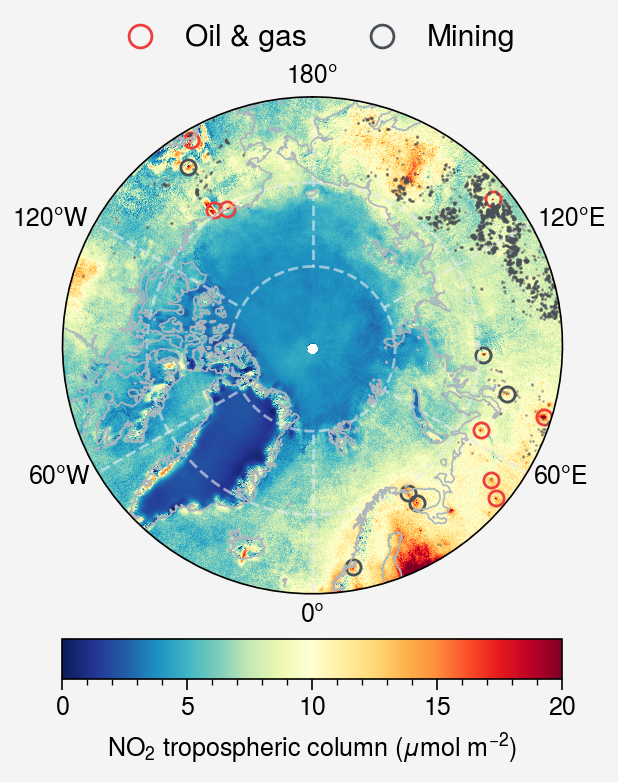

In [19]:
# fig, axs = pplt.subplots(proj=['npstere', None], ncols=2)
fig, axs = pplt.subplots(proj='npstere')

axs[0].format(boundinglat=60, latlines=10, coast=True, lonlabels='lrbt', coastcolor='gray5', reso='med', gridcolor='gray2', 
gridlinewidth=1, gridalpha=0.6, gridlinestyle='--',)

ax = axs[0]
plot_mean_no2(vcd_regrid, ax)

ax.scatter(oil_gas_points[:, 0], oil_gas_points[:, 1], facecolors='none', edgecolor='red7', edgewidth=1, s=30, label='Oil & gas')
ax.scatter(mining_points[:, 0], mining_points[:, 1], facecolors='none', edgecolor='gray7', edgewidth=1, s=30, label='Mining')
ax.legend(loc='t', frame=False, markerscale=1.5, fontsize='large')
ax.scatter(lon_fire, lat_fire, c='gray7', s=0.1, alpha=0.5)

# fig.savefig('../figures/no2_wildfire.png')

In [20]:
# calculate the daily no2_max for pixels
lat_index, lon_index = np.where(fire_count>300)

fire_vcd = vcd_max.isel(latitude=xr.DataArray(lat_index, dims="loc"), longitude=xr.DataArray(lon_index, dims="loc"))
fire_vcd = fire_vcd.where(fire_vcd>0)
fire_vcd.load()
fire_vcd = fire_vcd.stack(z=("time", "loc"))

oil_gas_vcd = vcd_max.sel(longitude=xr.DataArray(oil_gas_points[:, 0], dims="loc"), latitude=xr.DataArray(oil_gas_points[:, 1], dims="loc"), method='nearest').stack(z=("time", "loc"))
mining_vcd = vcd_max.sel(longitude=xr.DataArray(mining_points[:, 0], dims="loc"), latitude=xr.DataArray(mining_points[:, 1], dims="loc"), method='nearest').stack(z=("time", "loc"))
oil_gas_vcd.load()
mining_vcd.load()

<xarray.DataArray 'vcd_max' (z: 4944)>
array([nan, nan, nan, ..., nan, nan, nan])
Coordinates:
    latitude   (z) float64 63.65 69.45 65.95 69.25 ... 65.95 69.25 67.55 63.35
    longitude  (z) float64 -145.6 87.95 76.75 33.45 ... 76.75 33.45 33.95 10.35
  * z          (z) object MultiIndex
  * time       (z) datetime64[ns] 2019-06-01 2019-06-01 ... 2021-09-01
  * loc        (z) int64 0 1 2 3 4 5 0 1 2 3 4 5 0 ... 5 0 1 2 3 4 5 0 1 2 3 4 5
Attributes:
    units:    umol m-2

In [21]:
df_oilgas = pd.DataFrame({'Oil & gas': oil_gas_vcd.where(oil_gas_vcd>0, drop=True)})
df_mining = pd.DataFrame({'Mining': mining_vcd.where(mining_vcd>0, drop=True)})
df_fire = pd.DataFrame({'Fire': fire_vcd.where(fire_vcd>0, drop=True)})

lno2_emiss_pixel = xr.open_dataset('../data/lno2/S5P_LNO2_grid.nc')['lno2_max'].max(dim=['longitude', 'latitude'])#.mean(dim='swath')
df_lightning_pixel = pd.DataFrame({'Lightning': lno2_emiss_pixel*1e6})

# df_emiss = pd.concat([df_oilgas, df_mining, df_pipeline, df_lightning_pixel], ignore_index=True, axis=1)
# df_emiss.columns = ['Oil/gas', 'Mining', 'Pipeline', 'Lightning']

df_emiss = pd.concat([df_fire, df_oilgas, df_mining, df_lightning_pixel], ignore_index=True, axis=1)
df_emiss.columns = ['Wildfire', 'Oil & gas', 'Mining', 'Lightning']

In [22]:
print('lightning no2', df_emiss['Lightning'].mean(), '$\pm$', df_emiss['Lightning'].std())

print('lightning no2/anthropogenic no2: ', df_emiss['Lightning'].median()/df_emiss[['Wildfire', 'Oil & gas', 'Mining']].median().mean())

usa_no2 = 1.41e16 / 6.022e19 * 1e6
lno2_max = lno2_emiss_pixel.isel(swath=lno2_emiss_pixel.argmax())*1e6
print('lno2 max: ', lno2_max)
print('usa_no2', usa_no2)

lightning no2 60.57766947032291 $\pm$ 49.5096915442025
lightning no2/anthropogenic no2:  2.9384136511538914
lno2 max:  <xarray.DataArray 'lno2_max' ()>
array(246.23269327)
Coordinates:
    swath    <U10 'Swath19656'
usa_no2 234.14148123546994


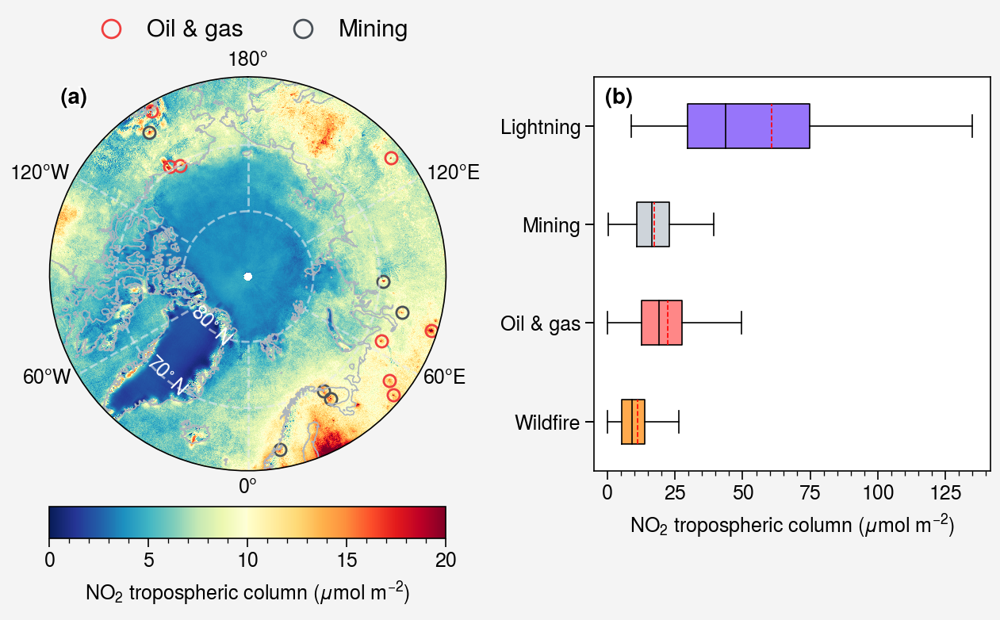

In [23]:
fig, axs = pplt.subplots(proj=['npstere', None], ncols=2)

axs[0].format(boundinglat=60, latlines=10, coast=True, lonlabels='lrbt', coastcolor='gray5', reso='med', gridcolor='gray2', 
gridlinewidth=1, gridalpha=0.6, gridlinestyle='--',)

ax = axs[0]
plot_mean_no2(vcd_regrid, ax)

ax.scatter(oil_gas_points[:, 0], oil_gas_points[:, 1], facecolors='none', edgecolor='red7', edgewidth=1, s=30, label='Oil & gas')
ax.scatter(mining_points[:, 0], mining_points[:, 1], facecolors='none', edgecolor='gray7', edgewidth=1, s=30, label='Mining')
ax.legend(loc='t', frame=False, markerscale=1.5, fontsize='large')

ax.text(-42, 66, '70$^{\circ}$ N', c='w', rotation=-45, transform=ccrs.PlateCarree())
ax.text(-42, 76, '80$^{\circ}$ N', c='w', rotation=-45, transform=ccrs.PlateCarree())


ax = axs[1]
cycle = {'Lightning': 'violet4', 'Oil & gas': 'red4', 'Mining': 'gray4', 'Wildfire': 'orange4'}
cycle = [cycle[x] for x in df_emiss.columns.values]
ax.boxh(df_emiss, means=True, marker='x', meancolor='r', showfliers=False, cycle=cycle) #fillcolor='gray4', 

ax.format(ymargin=0.15, xlabel='NO$_2$ tropospheric column ($\mu$mol m$^{-2}$)', xlim=(-5, None), grid=False)
axs.format(abc='(a)', abcloc='ul')

fig.savefig('../figures/no2_comp.pdf')

### Anthropogenic NOx

In [24]:
# drop duplicated variabels
# monthly data with units kg m-2 s-1
ds_cams = xr.open_dataset('../data/CAMS/CAMS-GLOB-ANT_v4.2_nitrogen-oxides_2018.nc', decode_times=False).drop_vars(['shp', 'ags', 'sum'])

# subset to arctic
ds_cams = ds_cams.assign_coords({'time': pd.date_range('2018-01-01', '2019-01-01', freq='M')})
ds_cams = ds_cams.sel(lat=slice(60, None))

# subset to summer
ds_cams = ds_cams.sel(time=slice('2018-06-01', '2018-09-01'))

In [25]:
ds_cams

<xarray.Dataset>
Dimensions:  (time: 3, lat: 300, lon: 3600)
Coordinates:
  * time     (time) datetime64[ns] 2018-06-30 2018-07-31 2018-08-31
  * lat      (lat) float32 60.05 60.15 60.25 60.35 ... 89.65 89.75 89.85 89.95
  * lon      (lon) float32 -179.9 -179.9 -179.8 -179.6 ... 179.8 179.9 179.9
Data variables:
    agl      (time, lat, lon) float32 ...
    awb      (time, lat, lon) float32 ...
    ene      (time, lat, lon) float32 ...
    fef      (time, lat, lon) float32 ...
    ind      (time, lat, lon) float32 ...
    res      (time, lat, lon) float32 ...
    slv      (time, lat, lon) float32 ...
    swd      (time, lat, lon) float32 ...
    tnr      (time, lat, lon) float32 ...
    tro      (time, lat, lon) float32 ...
Attributes:
    Conventions:      CF-1.6
    projection:       latlon
    authors:          N.Elguindi and C.Granier
    description:      Monthly emissions from CAMS-GLOB-ANT_v4.2 nox emissions...
    product_version:  v4.2
    title:            CAMS Global anthropogenic emissions
    institution:      Laboratoire d'Aérologie/CNRS 
    source:           EDGARv4.3.2 emissions up to 2010 and CEDS emissions up ...
    references:       Granier, C., S. Darras, H. Denier van der Gon, J. Douba...
    history:          Mon Mar  1 15:30:26 2021: ncap2 -s time=array(0,1,$time...
    publisher_url:    https://eccad.aeris-data.fr
    NCO:              netCDF Operators version 4.9.2 (Homepage = http://nco.s...

In [26]:
# sum into one variable
ds_cams_anthro = ds_cams.to_array().sum("variable")

# m2
area_cams_anthro = xr.open_dataset('../data/CAMS/CAMS-GLOB-ANT_v4.2_nitrogen-oxides_2018_area.nc')['cell_area']


# kg m-2 s-1 -> kg N m-2 s-1
ds_cams_anthro = ds_cams_anthro / 30  * 14

# convert to kg N m-2 mo-1
for t in ds_cams_anthro['time']:
    days = pd.Period(t.dt.strftime('%Y-%m').item(), freq='M').daysinmonth
    seconds = days * 24 * 3600
    ds_cams_anthro.loc[dict(time=t)] *= seconds
ds_cams_anthro = ds_cams_anthro / 3

# sum during summer
ds_cams_anthro = ds_cams_anthro.sum(dim='time')
ds_cams_anthro = ds_cams_anthro.where(ds_cams_anthro>0)
ds_cams_anthro.attrs['units'] = 'kg (N) m-2 mo-1'
# kg N m-2 -> kg N
# ds_cams_anthro = ds_cams_anthro.where(ds_cams_anthro>0)*area_cams_anthro

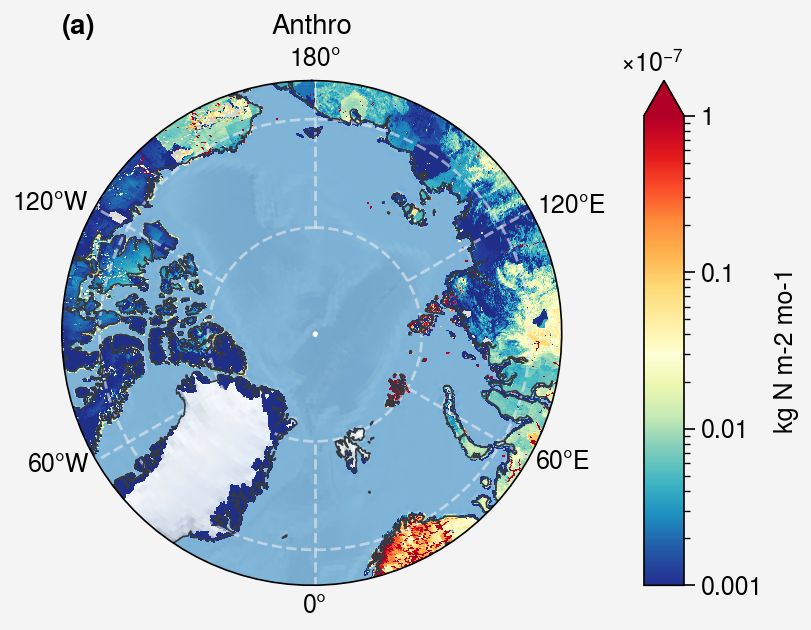

In [27]:
fig, axs = pplt.subplots(proj='npstere')

axs.format(reso='med', abc='(a)',
        latlines=10, gridcolor='gray2', gridlinewidth=1, gridalpha=0.6, gridlinestyle='--',
        lonlabels='lrbt', boundinglat=66.5,
        # landcolor='gray5', land=True,
        coast=True, coastcolor='gray8',
        )

axs.stock_img()


# anthro
x, y =  np.meshgrid(ds_cams_anthro['lon'], ds_cams_anthro['lat'])

m = axs.pcolormesh(x, y, ds_cams_anthro, cmap=cmap, discrete=False,
                  vmin=1e-10, vmax=1e-7,
                #   vmin=1e-2, vmax=10,
                  extend='max',
                  cmap_kw={'left': 0.05, 'right': 0.95},
                  norm=LogNorm()
                  )
axs.colorbar([m], loc='r', label='kg N m-2 mo-1')
axs.format(title='Anthro')

## Soil NOx

In [28]:
# monthly data with units kg m-2 s-1
ds_cams_soil = xr.open_dataset('../data/CAMS/CAMS-GLOB-SOIL_v2.2_nitrogen-oxides_2018.nc', decode_times=False)['TotalSoilEmis']

# subset to arctic
ds_cams_soil = ds_cams_soil.assign_coords({'time': pd.date_range('2018-01-01', '2019-01-01', freq='M')})
ds_cams_soil = ds_cams_soil.sel(lat=slice(60, None))

# subset to summer
ds_cams_soil = ds_cams_soil.sel(time=slice('2018-06-01', '2018-09-01'))

In [29]:
ds_cams_soil

<xarray.DataArray 'TotalSoilEmis' (time: 3, lat: 60, lon: 720)>
[129600 values with dtype=float32]
Coordinates:
  * time     (time) datetime64[ns] 2018-06-30 2018-07-31 2018-08-31
  * lat      (lat) float64 60.25 60.75 61.25 61.75 ... 88.25 88.75 89.25 89.75
  * lon      (lon) float64 -179.8 -179.2 -178.8 -178.2 ... 178.8 179.2 179.8
Attributes:
    Method:                  YLnSMI
    units:                   kg m-2 s-1
    long_name:               Above canopy soil N emissions from  total
    standard_name:           tendency_of_atmosphere_mass_content_of_nox_expre...
    molecular_weight:        30.f
    molecular_weight_units:  g mole-1

In [30]:
# m2
area_cams_soil = xr.open_dataset('../data/CAMS/CAMS-GLOB-SOIL_v2.2_nitrogen-oxides_2018_area.nc')['cell_area']

# kg m-2 s-1 -> kg N m-2 s-1
ds_cams_soil = ds_cams_soil / 30  * 14

# convert to kg N m-2 mo-1
for t in ds_cams_soil['time']:
    days = pd.Period(t.dt.strftime('%Y-%m').item(), freq='M').daysinmonth
    seconds = days * 24 * 3600
    ds_cams_soil.loc[dict(time=t)] *= seconds

# mean during summer
ds_cams_soil = ds_cams_soil.mean(dim='time')
ds_cams_soil.where(ds_cams_soil>0)

# kg N m-2 -> kg N
# ds_cams_soil = ds_cams_soil.where(ds_cams_soil>0)*area_cams_soil

<xarray.DataArray 'TotalSoilEmis' (lat: 60, lon: 720)>
array([[nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       ...,
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan]], dtype=float32)
Coordinates:
  * lat      (lat) float64 60.25 60.75 61.25 61.75 ... 88.25 88.75 89.25 89.75
  * lon      (lon) float64 -179.8 -179.2 -178.8 -178.2 ... 178.8 179.2 179.8

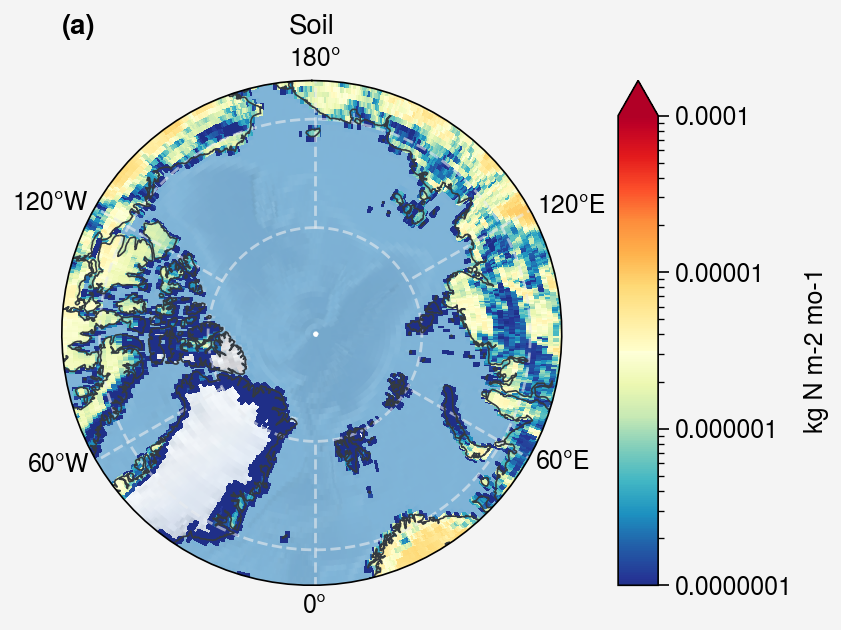

In [31]:
fig, axs = pplt.subplots(proj='npstere')

axs.format(reso='med', abc='(a)',
        latlines=10, gridcolor='gray2', gridlinewidth=1, gridalpha=0.6, gridlinestyle='--',
        lonlabels='lrbt', boundinglat=66.5,
        # landcolor='gray5', land=True,
        coast=True, coastcolor='gray8',
        )

axs.stock_img()


# anthro
x, y =  np.meshgrid(ds_cams_soil['lon'], ds_cams_soil['lat'])

m = axs.pcolormesh(x, y, ds_cams_soil, cmap=cmap, discrete=False,
                  vmin=1e-7, vmax=1e-4,
                #   vmin=1e2, vmax=1e5,
                  extend='max',
                  cmap_kw={'left': 0.05, 'right': 0.95},
                  norm=LogNorm()
                  )
axs.colorbar([m], loc='r', label='kg N m-2 mo-1')
axs.format(title='Soil')

## Ship NOx

In [32]:
# daily data with units kg m-2 s-1
ds_cams_ship = xr.open_dataset('../data/CAMS/CAMS-GLOB-SHIP_v2.1_nitrogen-oxides_2018.nc', decode_times=False)['sum']

# # subset to arctic
ds_cams_ship = ds_cams_ship.assign_coords({'time': pd.date_range('2018-01-01', '2018-12-31', freq='D')})
ds_cams_ship = ds_cams_ship.sel(lat=slice(None, 60))

# subset to summer
ds_cams_ship = ds_cams_ship.sel(time=slice('2018-06-01', '2018-08-31'))

In [33]:
ds_cams_ship

<xarray.DataArray 'sum' (time: 92, lat: 121, lon: 1440)>
[16030080 values with dtype=float32]
Coordinates:
  * time     (time) datetime64[ns] 2018-06-01 2018-06-02 ... 2018-08-31
  * lat      (lat) float32 90.0 89.75 89.5 89.25 89.0 ... 60.75 60.5 60.25 60.0
  * lon      (lon) float32 -180.0 -179.8 -179.5 -179.2 ... 179.2 179.5 179.8
Attributes:
    units:                   kg m-2 s-1
    standard_name:           tendency_of_atmosphere_mass_content_of_nox_expre...
    molecular_weight_units:  g mole-1
    cell_method:             time: sum (interval: 1 year comment: gregorian c...
    long_name:               NOx emissions
    molecular_weight:        30.0

In [34]:
# km2 --> m2
area_cams_ship = xr.open_dataset('../data/CAMS/CAMS-GLOB-SHIP_v2.1_nitrogen-oxides_2018.nc', decode_times=False)['gridcell_area'] *1e6

# kg m-2 s-1 -> kg N m-2 s-1
ds_cams_ship = ds_cams_ship / 30  * 14

# convert to kg N m-2 mo-1
ds_cams_ship = ds_cams_ship * 24  * 3600 / 3

# mean during summer
ds_cams_ship = ds_cams_ship.sum(dim='time')
ds_cams_ship = ds_cams_ship.where(ds_cams_ship>0)

# kg N m-2 -> kg N
# ds_cams_ship = ds_cams_ship.where(ds_cams_ship>0)*area_cams_ship

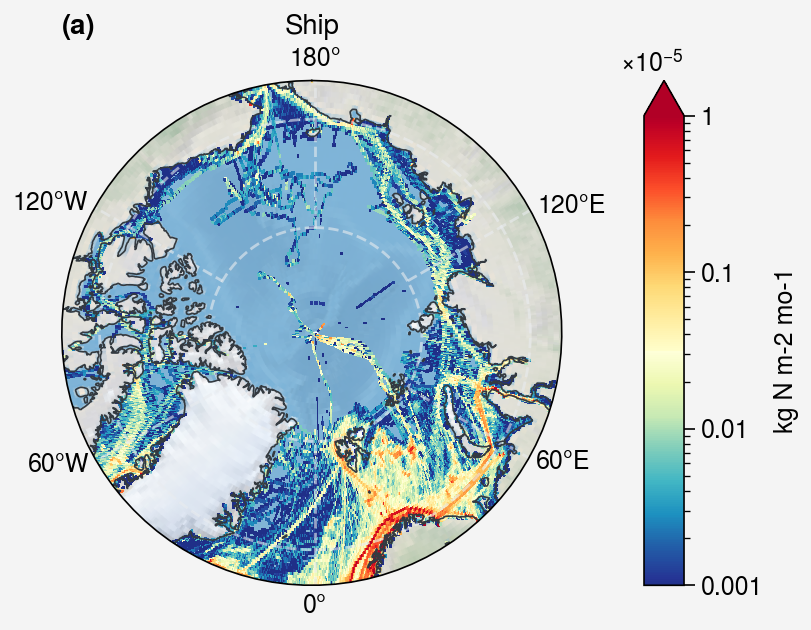

In [35]:
fig, axs = pplt.subplots(proj='npstere')

axs.format(reso='med', abc='(a)',
        latlines=10, gridcolor='gray2', gridlinewidth=1, gridalpha=0.6, gridlinestyle='--',
        lonlabels='lrbt', boundinglat=66.5,
        # landcolor='gray5', land=True,
        coast=True, coastcolor='gray8',
        )

axs.stock_img()


# ship
x, y =  np.meshgrid(ds_cams_ship['lon'], ds_cams_ship['lat'])

m = axs.pcolormesh(x, y, ds_cams_ship, cmap=cmap, discrete=False,
                  vmin=1e-8, vmax=1e-5,
                #   vmin=10, vmax=1e4,
                  extend='max',
                  cmap_kw={'left': 0.05, 'right': 0.95},
                  norm=LogNorm()
                  )
axs.colorbar([m], loc='r', label='kg N m-2 mo-1')
axs.format(title='Ship')

## Wildfire NOx

In [36]:
xr.open_mfdataset(['../data/GFAS/gfas_2019.nc', '../data/GFAS/gfas_2020.nc', '../data/GFAS/gfas_2021.nc'])['noxfire']

<xarray.DataArray 'noxfire' (time: 276, latitude: 1800, longitude: 3600)>
dask.array<concatenate, shape=(276, 1800, 3600), dtype=float32, chunksize=(92, 1800, 3600), chunktype=numpy.ndarray>
Coordinates:
  * longitude  (longitude) float32 0.05 0.15 0.25 0.35 ... 359.8 359.9 360.0
  * latitude   (latitude) float32 89.95 89.85 89.75 ... -89.75 -89.85 -89.95
  * time       (time) datetime64[ns] 2019-06-01 2019-06-02 ... 2021-08-31
Attributes:
    units:      kg m**-2 s**-1
    long_name:  Wildfire flux of Nitrogen Oxides NOx

In [37]:
# daily data with units kg m-2 s-1
# each data is from 06-01 to 08-31
ds_cams_fire = xr.open_mfdataset(['../data/GFAS/gfas_2019.nc', '../data/GFAS/gfas_2020.nc', '../data/GFAS/gfas_2021.nc'])['noxfire']

# subset to arctic
ds_cams_fire = ds_cams_fire.sel(latitude=slice(None, 60))

# m2
area_cams_fire = xr.open_dataset('../data/GFAS/gfas_2018_area.nc', decode_times=False)['cell_area']

# kg m-2 s-1 -> kg N m-2 s-1
ds_cams_fire = ds_cams_fire / 30  * 14

# convert to kg N m-2
ds_cams_fire = ds_cams_fire * 24  * 3600

# sum during summer and calculate the monthly mean
# kg N m-2 --> kg N m-2 mo-1
ds_cams_fire = ds_cams_fire.sum(dim='time') / 9
ds_cams_fire = ds_cams_fire.where(ds_cams_fire>0)

# convert longitude to -180 to 180
ds_cams_fire.coords['longitude'] = (ds_cams_fire.coords['longitude'] + 180) % 360 - 180
ds_cams_fire = ds_cams_fire.sortby(ds_cams_fire.longitude)

In [38]:
ds_cams_fire.load()

<xarray.DataArray 'noxfire' (latitude: 300, longitude: 3600)>
array([[nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       ...,
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan]], dtype=float32)
Coordinates:
  * longitude  (longitude) float32 -180.0 -179.9 -179.8 ... 179.8 179.9 180.0
  * latitude   (latitude) float32 89.95 89.85 89.75 89.65 ... 60.25 60.15 60.05

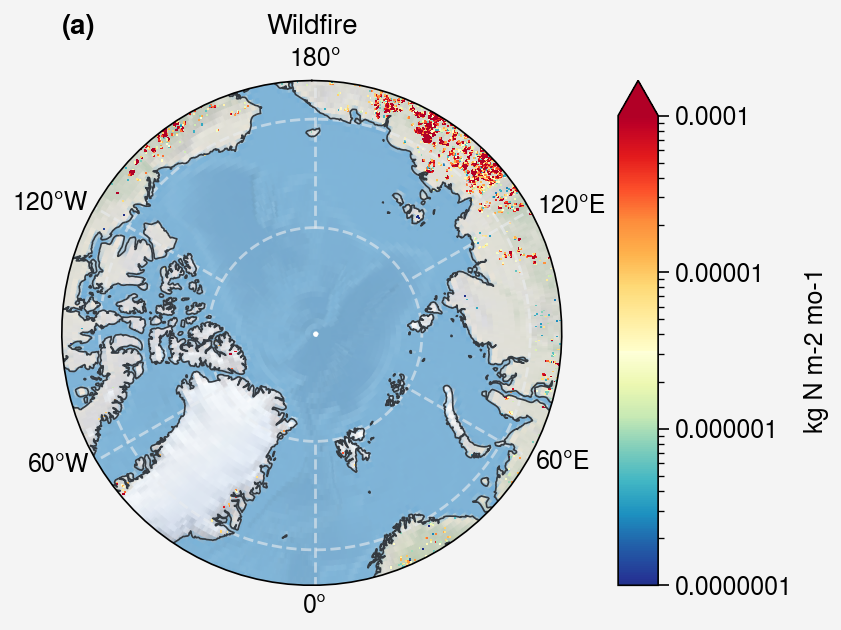

In [39]:
fig, axs = pplt.subplots(proj='npstere')

axs.format(reso='med', abc='(a)',
        latlines=10, gridcolor='gray2', gridlinewidth=1, gridalpha=0.6, gridlinestyle='--',
        lonlabels='lrbt', boundinglat=66.5,
        # landcolor='gray5', land=True,
        coast=True, coastcolor='gray8',
        )

axs.stock_img()


# ship
x, y =  np.meshgrid(ds_cams_fire['longitude'], ds_cams_fire['latitude'])

m = axs.pcolormesh(x, y, ds_cams_fire, cmap=cmap, discrete=False,
                  vmin=1e-7, vmax=1e-4,
                #   vmin=10, vmax=1e4,
                  extend='max',
                  cmap_kw={'left': 0.05, 'right': 0.95},
                  norm=LogNorm()
                  )

axs.colorbar([m], loc='r', label='kg N m-2 mo-1')
axs.format(title='Wildfire')

## Lightning NOx

In [40]:
df_lightning = pd.read_csv('../data/gld360/gld-stroke-count-m0p1.csv')
df_lightning.set_index(['time'], inplace=True)
df_lightning.index = pd.to_datetime(df_lightning.index)

# corrected by detection efficiency and IC:CG ratio (~1)
df_lightning['eventCount'] *= 4

# assign the count to new column
df_lightning['lno2'] = df_lightning['eventCount']

# subset to arctic summer
df_lightning = df_lightning[df_lightning['latitude']>70]
df_lightning_all = df_lightning
df_lightning = df_lightning[df_lightning.index.month.isin([6,7,8])]

In [41]:
def get_geom(name, category='physical', resolution='50m'):
    # https://stackoverflow.com/questions/47894513/
    #    checking-if-a-geocoordinate-point-is-land-or-ocean-with-cartopy
    shp_fname = shpreader.natural_earth(name=name,
                                        resolution=resolution,
                                        category=category
                                       )
    if name == 'coastline':
        # https://shapely.readthedocs.io/en/stable/manual.html#object.buffer
        geom = unary_union(list(shpreader.Reader(shp_fname).geometries())).buffer(0.5)
    else:
        geom = unary_union(list(shpreader.Reader(shp_fname).geometries()))

    return prep(geom)

In [42]:
land_geom = get_geom('land')
coast_geom = get_geom('coastline')
ocean_geom = get_geom('ocean')

In [43]:
# check which region in which the lightning is located
cond_coast = shapely.vectorized.contains(coast_geom, df_lightning['longitude'], df_lightning['latitude'])
cond_land = shapely.vectorized.contains(land_geom, df_lightning['longitude'], df_lightning['latitude'])
cond_ocean = shapely.vectorized.contains(ocean_geom, df_lightning['longitude'], df_lightning['latitude'])

region = np.argmax(np.vstack((cond_coast, cond_land, cond_ocean))==1, axis=0)
df_lightning['region'] = region

# -------- same for all lightning
# check which region in which the lightning is located
cond_coast = shapely.vectorized.contains(coast_geom, df_lightning_all['longitude'], df_lightning_all['latitude'])
cond_land = shapely.vectorized.contains(land_geom, df_lightning_all['longitude'], df_lightning_all['latitude'])
cond_ocean = shapely.vectorized.contains(ocean_geom, df_lightning_all['longitude'], df_lightning_all['latitude'])

region = np.argmax(np.vstack((cond_coast, cond_land, cond_ocean))==1, axis=0)
df_lightning_all['region'] = region

/var/folders/cq/3gpzzbcn09v0cq17f4n6hjcr0000gn/T/ipykernel_10544/2449446743.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_lightning['region'] = region


In [44]:
# copied from the `distribution_emission` notebook
pe_lno2_coast = 3.5
pe_lno2_land = 2.0
pe_lno2_ocean = 11.5

# multiple the LNO2 PE
# 0: 'coast', 1: 'land', 2: 'ocean'
df_lightning.loc[df_lightning.region == 0, 'lno2'] *= pe_lno2_coast
df_lightning.loc[df_lightning.region == 1, 'lno2'] *= pe_lno2_land
df_lightning.loc[df_lightning.region == 2, 'lno2'] *= pe_lno2_ocean

df_lightning_all.loc[df_lightning_all.region == 0, 'lno2'] *= pe_lno2_coast
df_lightning_all.loc[df_lightning_all.region == 1, 'lno2'] *= pe_lno2_land
df_lightning_all.loc[df_lightning_all.region == 2, 'lno2'] *= pe_lno2_ocean

In [45]:
lon_resolution = 0.1
lat_resolution = 0.1
lon_bnd = np.arange(-180, 180+lon_resolution, lon_resolution)
lat_bnd = np.arange(70, 90+lat_resolution, lat_resolution)
lon_center = np.convolve(lon_bnd, np.ones(2), 'valid') / 2
lat_center = np.convolve(lat_bnd, np.ones(2), 'valid') / 2

lightning_count = stats.binned_statistic_2d(df_lightning['longitude'], df_lightning['latitude'], df_lightning['eventCount'], \
                                            'sum', bins=[lon_bnd,lat_bnd]).statistic

lno2_resample = stats.binned_statistic_2d(df_lightning['longitude'], df_lightning['latitude'], df_lightning['lno2'], \
                                            'sum', bins=[lon_bnd,lat_bnd]).statistic

# lno2_resample = stats.binned_statistic_2d(df_lightning['latitude'], df_lightning['longitude'],  df_lightning['lno2'], \
#                                             'sum', bins=[lat_bnd, lon_bnd]).statistic


lno2_resample = xr.DataArray(lno2_resample, dims=['lon', 'lat'], coords=[lon_center, lat_center]).rename('lno2')
lightning_count = xr.DataArray(lightning_count, dims=['lon', 'lat'], coords=[lon_center, lat_center]).rename('lno2')

lno2_resample['lon'].attrs['standard_name'] = "longitude"
lno2_resample['lon'].attrs['units'] = "degrees_east"
lno2_resample['lat'].attrs['standard_name'] = "latitude"
lno2_resample['lat'].attrs['units'] = "degrees_north"

# mol
lno2_resample /= 9  # per month
lno2_resample.attrs['units'] = 'mol mo-1'
lno2_resample.to_netcdf('../data/LNO2_emiss.nc')

In [46]:
# !cdo gridarea ../data/lno2/LNO2_emiss.nc ../data/lno2/LNO2_emiss_area.nc

In [47]:
lno2_area = xr.open_dataset('../data/lno2/LNO2_emiss_area.nc')['cell_area']

In [48]:
# convert mol mo-1 to kg N m-2 mo-1
lno2 = lno2_resample * 14/1000 / lno2_area

## Emission Comparison (per unit area)

In [49]:
ds_cams_anthro

<xarray.DataArray (lat: 300, lon: 3600)>
array([[nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       ...,
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan]], dtype=float32)
Coordinates:
  * lat      (lat) float32 60.05 60.15 60.25 60.35 ... 89.65 89.75 89.85 89.95
  * lon      (lon) float32 -179.9 -179.9 -179.8 -179.6 ... 179.8 179.9 179.9
Attributes:
    units:    kg (N) m-2 mo-1

/var/folders/cq/3gpzzbcn09v0cq17f4n6hjcr0000gn/T/ipykernel_10544/3290329822.py:10: ProplotWarning: Calling arbitrary axes methods from SubplotGrid was deprecated in v0.8 and will be removed in a future release. Please index the grid or loop over the grid instead.
  axs.stock_img()
/var/folders/cq/3gpzzbcn09v0cq17f4n6hjcr0000gn/T/ipykernel_10544/3290329822.py:83: ProplotWarning: Calling arbitrary axes methods from SubplotGrid was deprecated in v0.8 and will be removed in a future release. Please index the grid or loop over the grid instead.
  axs.text(-42, 66, '70$^{\circ}$ N', rotation=-45, transform=ccrs.PlateCarree())
/var/folders/cq/3gpzzbcn09v0cq17f4n6hjcr0000gn/T/ipykernel_10544/3290329822.py:84: ProplotWarning: Calling arbitrary axes methods from SubplotGrid was deprecated in v0.8 and will be removed in a future release. Please index the grid or loop over the grid instead.
  axs.text(-42, 76, '80$^{\circ}$ N', rotation=-45, transform=ccrs.PlateCarree())


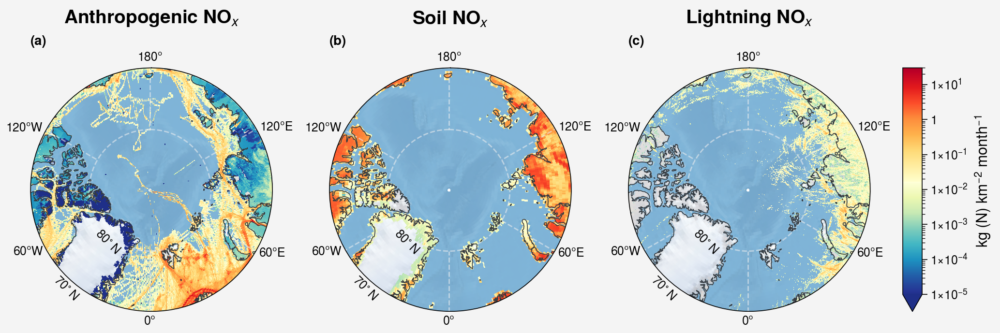

In [50]:
fig, axs = pplt.subplots(proj='npstere', nrows=1, ncols=3)

axs.format(reso='med', abc='(a)',
        latlines=10, gridcolor='gray2', gridlinewidth=1, gridalpha=0.6, gridlinestyle='--',
        lonlabels='lrbt', boundinglat=70,
        # landcolor='gray5', land=True,
        coast=True, coastcolor='gray8',
        )

axs.stock_img()

# wildfire
x, y =  np.meshgrid(ds_cams_anthro['lon'], ds_cams_anthro['lat'])

m = axs[0].pcolormesh(x, y, ds_cams_anthro*1e6, cmap=cmap, discrete=False,
                  vmin=1e-5, vmax=30,
                  extend='both',
                  cmap_kw={'left': 0.05, 'right': 0.95},
                  norm=LogNorm(),
                  rasterized=True
                  )

# ship
x, y =  np.meshgrid(ds_cams_ship['lon'], ds_cams_ship['lat'])
m = axs[0].pcolormesh(x, y, ds_cams_ship*1e6, cmap=cmap, discrete=False,
                #   vmin=10, vmax=3e4,
                  vmin=1e-5, vmax=30,
                  extend='both',
                  cmap_kw={'left': 0.05, 'right': 0.95},
                  norm=LogNorm(),
                  rasterized=True
                  )
# axs[1].colorbar([m], loc='r', label='kg (N) km$^{-2}$ month$^{-1}$')
# axs[0].format(title='Anthropogenic')

# # wildfire
# x, y =  np.meshgrid(ds_cams_fire['longitude'], ds_cams_fire['latitude'])

# m = axs[1].pcolormesh(x, y, ds_cams_fire*1e6, cmap=cmap, discrete=False,
#                   vmin=1e-5, vmax=30,
#                   extend='both',
#                   cmap_kw={'left': 0.05, 'right': 0.95},
#                   norm=LogNorm(),
#                   rasterized=True
#                   )
# axs[1].format(title='Wildfire')



# soil
x, y =  np.meshgrid(ds_cams_soil['lon'], ds_cams_soil['lat'])

m = axs[1].pcolormesh(x, y, ds_cams_soil*1e6, cmap=cmap, discrete=False,
                  vmin=1e-5, vmax=30,
                  extend='both',
                  cmap_kw={'left': 0.05, 'right': 0.95},
                  norm=LogNorm(),
                  rasterized=True
                  )
# axs[1].colorbar([m], loc='r', label='kg (N) km$^{-2}$ month$^{-1}$')
# axs[1].format(title='Soil')


# lightning
y, x =  np.meshgrid(lno2['lat'], lno2['lon'])

m = axs[2].pcolormesh(x, y, lno2*2.4*1e6, cmap=cmap, discrete=False,
                  vmin=1e-5, vmax=30,
                  # vmin=5e-6, vmax=1e-5,
                  # vmin=10, vmax=3e4,
                  extend='min',
                  cmap_kw={'left': 0.05, 'right': 0.95},
                  norm=LogNorm(),
                  rasterized=True
                  )
# axs[2].colorbar([m], loc='r', label='kg (N) km$^{-2}$ month$^{-1}$')
# axs[2].format(title='Lightning')


fig.colorbar([m], formatter='sci', loc='r', label='kg (N) km$^{-2}$ month$^{-1}$', labelsize=11)


axs.text(-42, 66, '70$^{\circ}$ N', rotation=-45, transform=ccrs.PlateCarree())
axs.text(-42, 76, '80$^{\circ}$ N', rotation=-45, transform=ccrs.PlateCarree())
axs.format(toplabels=['Anthropogenic NO$_x$', 'Soil NO$_x$', 'Lightning NO$_x$'], toplabelsize=14)

fig.savefig('../figures/emission_comp.pdf')

## LNOx emission

In [51]:
event_count = df_lightning.groupby(by=[df_lightning.index.year, pd.cut(df_lightning.latitude,[70, 75, 80, 85, 90])])['eventCount'].sum().reset_index().pivot(index='time', columns='latitude', values='eventCount')
event_count['total'] = event_count.sum(axis=1)

event_count

latitude,"(70, 75]","(75, 80]","(80, 85]","(85, 90]",total
time,,,,,
2019,1142292,40660,5756,636,1189344
2020,1402304,233780,4784,768,1641636
2021,889248,62296,26576,2536,980656


In [52]:
lno2_emission = df_lightning.groupby(by=[df_lightning.index.year, pd.cut(df_lightning.latitude,[70, 75, 80, 85, 90])])['lno2'].sum().reset_index().pivot(index='time', columns='latitude', values='lno2')* 14 / 1e6
lno2_emission['total'] = lno2_emission.sum(axis=1)
lno2_emission.loc['mean']= lno2_emission.mean(axis=0)

lno2_emission

latitude,"(70, 75]","(75, 80]","(80, 85]","(85, 90]",total
time,,,,,
2019,87.323656,5.576704,0.886396,0.102396,93.889152
2020,85.507156,22.068284,0.767984,0.123648,108.467072
2021,58.622508,8.585668,3.869264,0.408296,71.485736
mean,77.151107,12.076885,1.841215,0.211447,91.280653


In [53]:
lno2_emission.round(decimals=1)#.to_latex()

latitude,"(70, 75]","(75, 80]","(80, 85]","(85, 90]",total
time,,,,,
2019,87.3,5.6,0.9,0.1,93.9
2020,85.5,22.1,0.8,0.1,108.5
2021,58.6,8.6,3.9,0.4,71.5
mean,77.2,12.1,1.8,0.2,91.3


In [54]:
lnox_emission = 2.4 * df_lightning.groupby(by=[df_lightning.index.year, pd.cut(df_lightning.latitude,[70, 75, 80, 85, 90])])['lno2'].sum().reset_index().pivot(index='time', columns='latitude', values='lno2')* 14 / 1e6
# unit: Mg
lnox_emission['total'] = lnox_emission.sum(axis=1)
lnox_emission.loc['mean']= lnox_emission.mean(axis=0)

lnox_emission

latitude,"(70, 75]","(75, 80]","(80, 85]","(85, 90]",total
time,,,,,
2019,209.576774,13.384090,2.127350,0.245750,225.333965
2020,205.217174,52.963882,1.843162,0.296755,260.320973
2021,140.694019,20.605603,9.286234,0.979910,171.565766
mean,185.162656,28.984525,4.418915,0.507472,219.073568


In [55]:
# kg N m-2 mo-1 -> kg N mo-1
anthro_emission = ds_cams_anthro * area_cams_anthro
fire_emission = ds_cams_fire * area_cams_fire
soil_emission = ds_cams_soil * area_cams_soil
fire_emission = ds_cams_fire * area_cams_fire
ship_emission = ds_cams_ship * area_cams_ship

print('anthro_emission emission (Mg N mo-1): ', anthro_emission.sel(lat=slice(70, 90)).sum().item()/1e3)
print('ship emission (Mg N mo-1): ', ship_emission.sel(lat=slice(90, 70)).sum().item()/1e3)
print('fire emission (Mg N mo-1): ', fire_emission.sel(latitude=slice(90, 70)).sum().item()/1e3)
print('soil emission (Mg N mo-1): ', soil_emission.sel(lat=slice(70, 90)).sum().item()/1e3)
print('LNOx emission (Mg N mo-1): ', lnox_emission['total'].loc['mean']/3)
print('LNO2 emission (Mg N mo-1): ', lno2_resample.sum().item() * 14/1e6) # mol mo-1 --> Mg N mo-1

anthro_emission emission (Mg N mo-1):  351.67716750521043
ship emission (Mg N mo-1):  1160.143
fire emission (Mg N mo-1):  432.18911534668007
soil emission (Mg N mo-1):  2668.214118512191
LNOx emission (Mg N mo-1):  73.02452266666667
LNO2 emission (Mg N mo-1):  30.426884444444447


In [56]:
print('yearly LNOx emission (Gg N): ', (df_lightning_all['lno2'].sum())*2.4* 14 / 1e9 / 3)

print('summertime LNOx emission (Gg N): ', (df_lightning['lno2'].sum())*2.4* 14 / 1e9/ 3)
# kg N mo-1 --> Gg N 3mo
print('summertime anthro emission (Gg N): ', anthro_emission.sel(lat=slice(70, 90)).sum().item()/1e6*3)
print('summertime fire emission (Gg N): ', fire_emission.sel(latitude=slice(90, 70)).sum().item()/1e6*3)
print('summertime soil emission (Gg N): ', soil_emission.sel(lat=slice(70, 90)).sum().item()/1e6*3)
print('summertime ship emission (Gg N): ', ship_emission.sel(lat=slice(90, 70)).sum().item()/1e6*3)


yearly LNOx emission (Gg N):  0.22232674239999997
summertime LNOx emission (Gg N):  0.219073568
summertime anthro emission (Gg N):  1.0550315025156314
summertime fire emission (Gg N):  1.2965673460400402
summertime soil emission (Gg N):  8.004642355536573
summertime ship emission (Gg N):  3.480429


In [57]:
# check the proportin of lightning no2 emission in the northeast of Arctic ocean
df_lightning_high = df_lightning.loc[(df_lightning['longitude']>90)&(df_lightning['longitude']<180)&(df_lightning['latitude']>80)]

lightning_high_lnox = 2.4 * df_lightning_high.groupby(by=[df_lightning_high.index.year])['lno2'].sum().mean(axis=0)* 14 / 1e6
ship_high_lnox = ship_emission.sel(lat=slice(90, 80), lon=slice(90,180)).sum()/1e3

print('Proportion of LNOx in the northeast of Arctic ocean: ', lightning_high_lnox/(lightning_high_lnox+ship_high_lnox))

Proportion of LNOx in the northeast of Arctic ocean:  <xarray.DataArray ()>
array(0.9362479)
